In [1]:
from tools import datacleaner as dtclean
from tools import dataexplore as dtexp
from view import data_visualization as dtview
import pandas as pd
import numpy as np
import requests
import orca
import psutil
from fbprophet import Prophet
from evaluation import forecast_metrics as fm
import seaborn as sns
import plotly.graph_objs as go
import plotly.tools
import matplotlib.pyplot as plt
# Offline mode
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import warnings

warnings.filterwarnings('ignore')
# "high resolution"
%config InlineBackend.figure_format = 'retina'
init_notebook_mode(connected=True)

___
# Análise de Dados Exploratória
___

In [2]:
df_274_time_sale = dtclean.get_Dataframes_time(274,'s')
df_completo = dtclean.get_Dataframes(274,'c',full_dataframe=True)
df_432_time_sale = dtclean.get_Dataframes_time(432,'s')
df_274_time_sale.reset_index(inplace=True)
df_274_sale = dtclean.get_Dataframes(274,'s')
df_274_sale.reset_index(inplace=True)

sns.set(style="darkgrid")
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
print('Data início: {}, Data final: {}'.format(df_274_time_sale.ds.min(),df_274_time_sale.ds.max()))
df_274_time_sale.info()

#df_274_time_sale.to_csv('274_hourly_dataset.csv')
#df_274_sale.to_csv('274_daily_dataset.csv')

Data início: 2020-03-01 07:30:00, Data final: 2020-05-31 20:30:00
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2555 entries, 0 to 2554
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      2555 non-null   datetime64[ns]
 1   y       2555 non-null   int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 40.0 KB


# Comparação da distribuição dos dados entre as lojas

In [3]:
title='Distribuição dos dados por loja'
title2='Distribuição dos valores negativos por loja'
labels_1 = ['Loja 432','Loja 274']
labels_2 = ['Loja 432 Total valores negativos','Loja 274 Total valores negativos']
annot_text_1 = 'Loja 432'
annot_text_2 = 'Loja 274'
iplot(dtview.plot_total_dataframe_data(
    df_432_time_sale,
    df_274_time_sale,
    title=title,
    title2=title2,
    labels_1=labels_1,
    labels_2=labels_2,
    annot_text_1=annot_text_1,
    annot_text_2=annot_text_2))


# Obtendo Horário de Funcionamento da loja 274

In [4]:
pd.DataFrame(df_274_time_sale.groupby(df_274_time_sale['ds'].dt.hour)["ds"].count()).to_csv('274_distribuicao_horas_por_dia.csv')
df_274_time_sale.groupby(df_274_time_sale['ds'].dt.hour)["ds"].count()

ds
6       5
7      59
8     183
9     183
10    184
11    184
12    184
13    184
14    184
15    184
16    184
17    182
18    182
19    182
20    182
21    102
22      7
Name: ds, dtype: int64

In [5]:
title='Distribuição das horas'
xaxes_title='Horas'
yaxis_title='Quantidade de datas com a hora'
x_values=[6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22]
y_values=[5,59,183,183,184,184,184,184,184,184,184,182,182,182,182,102,7]
dtview.plot_results(x_values,y_values,title=title,xaxes_title=xaxes_title,yaxis_title=yaxis_title)

<div class="alert alert-block alert-info">
<b>Verificamos que os dados da loja 274, ainda que com algumas inconsistências, permitem que seu uso na análise seja com
maior confiabilidade do que os dados da loja 432 já que, além de o maior volume de dados fazer parte da loja 274,
observamos que os valores negativos nas variáveis de quantidade cliente e de produtos vendidos, somente ocorre nos dados
da loja 432.
</div>

# Análise da Série Temporal na Loja 274 (01 de março a 31 de maio de 2020)

# Comportamento dos dados ao longo dos dias e das semanas

In [6]:
df_new = dtexp.date_features(df_274_sale)
mesAgregado = pd.DataFrame(df_new.groupby("semana")["y"].sum()).reset_index().sort_values('y')
semanaAgregada = pd.DataFrame(df_new.groupby("num")["y"].sum()).reset_index().sort_values('num')
iplot(dtview.plot_dados_agregados_semana_mes(mesAgregado,tipo_agregacao='m',xaxes_title='Nº da semana',yaxis_title='Total de produtos vendidos',
                                      title='Vendas por Semana', hover='31/05'))
iplot(dtview.plot_dados_agregados_semana_mes(semanaAgregada,xaxes_title='Nº do dia (0 = Domingo, 1 = Segunda ...)',yaxis_title='Total de produtos vendidos',
                                      title='Vendas por dia'))

# Prevendo os dados por hora e por dia usando o Prophet

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


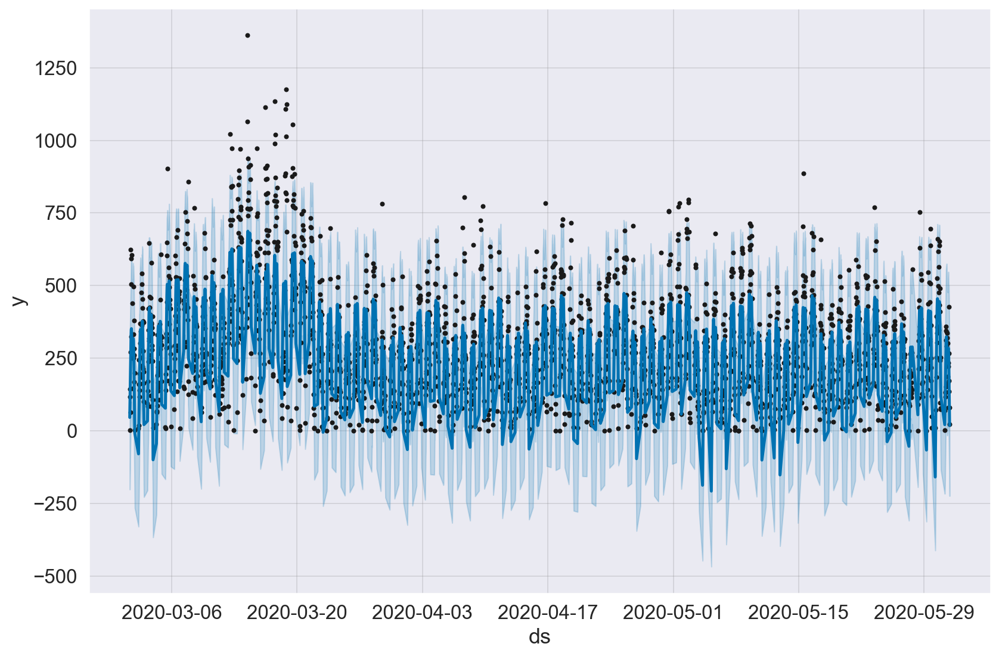

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


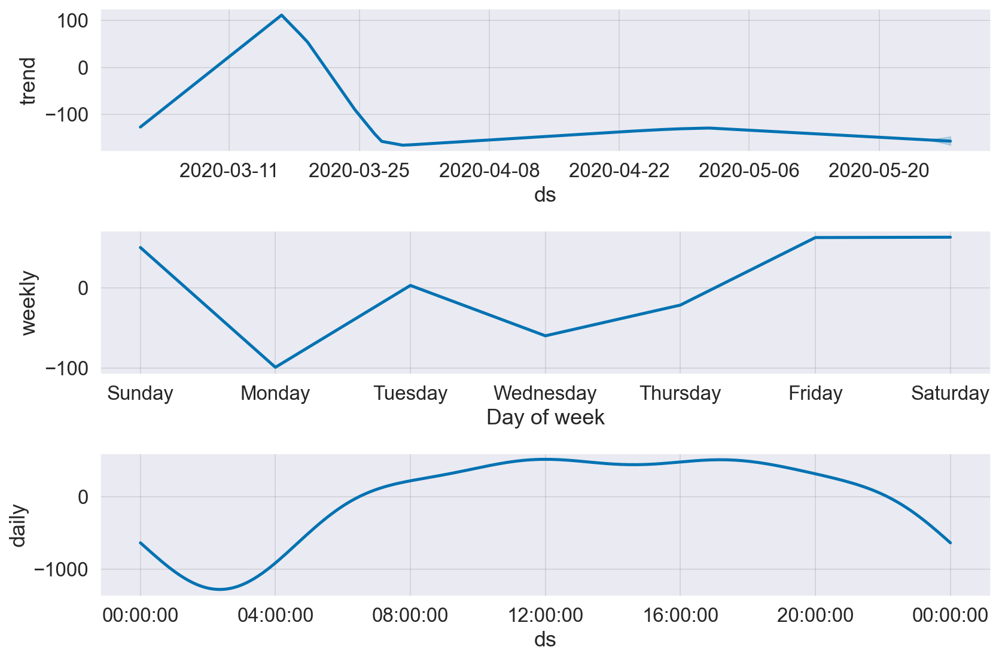

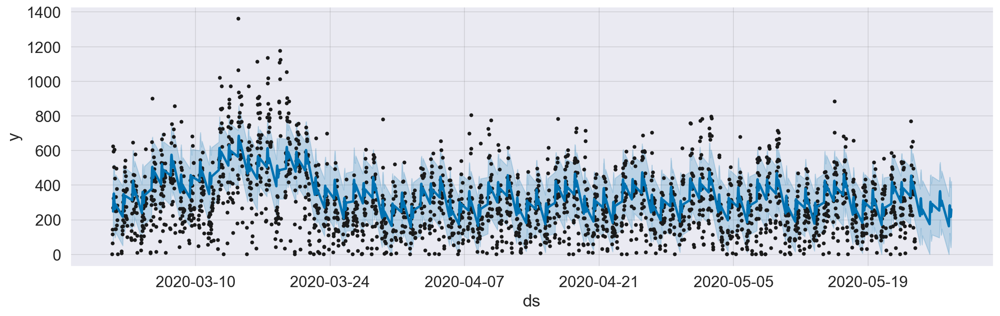

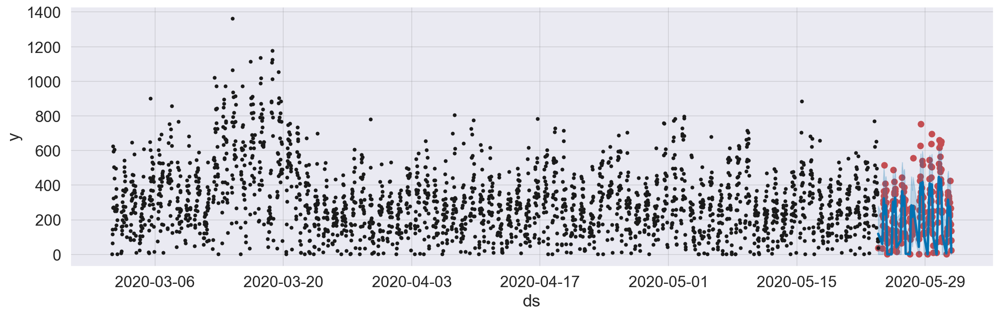

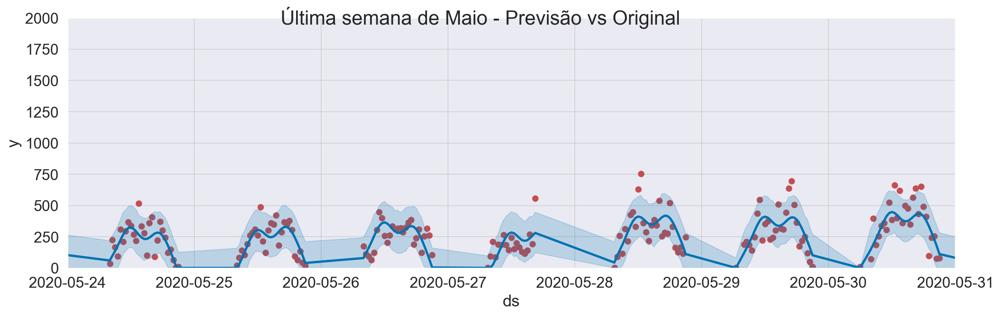

MAPE ------> 0.7240836968973005


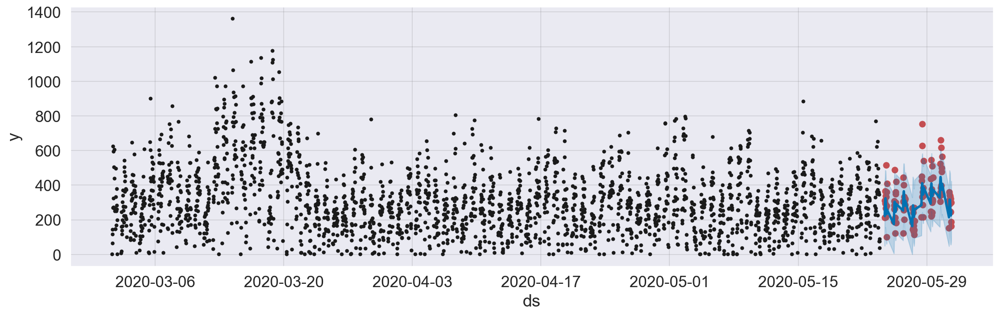

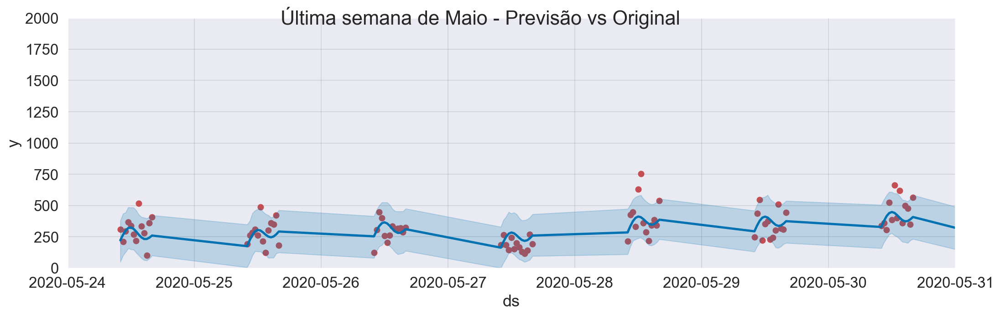

MAPE ------> 0.28547739903285607


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


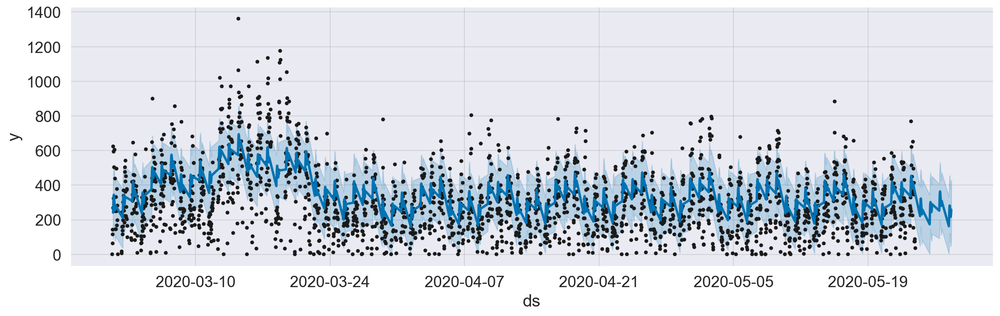

MAPE 0.715228333144664


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


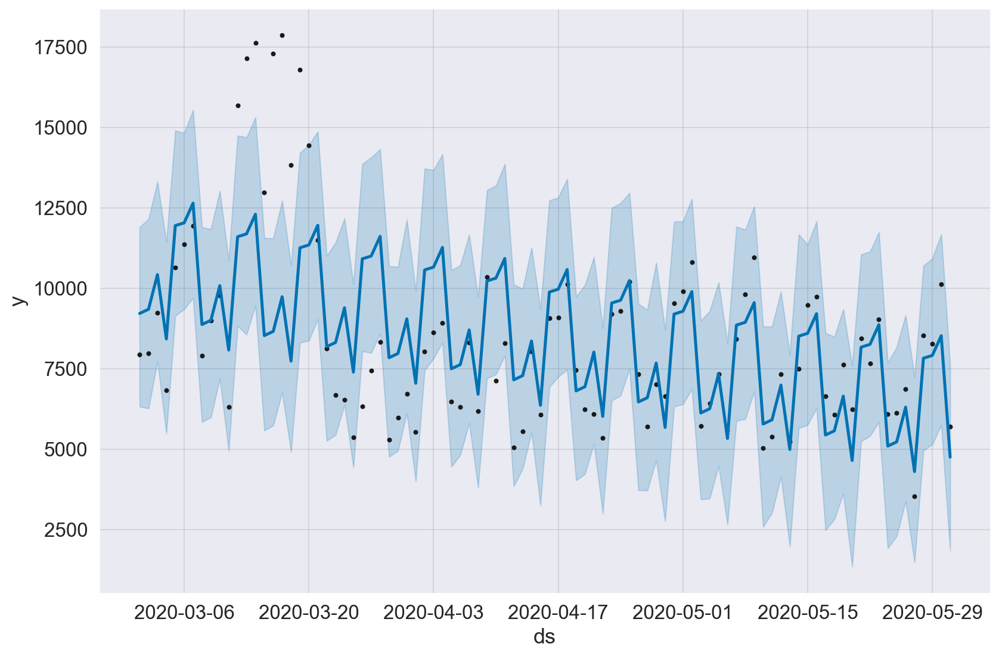

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


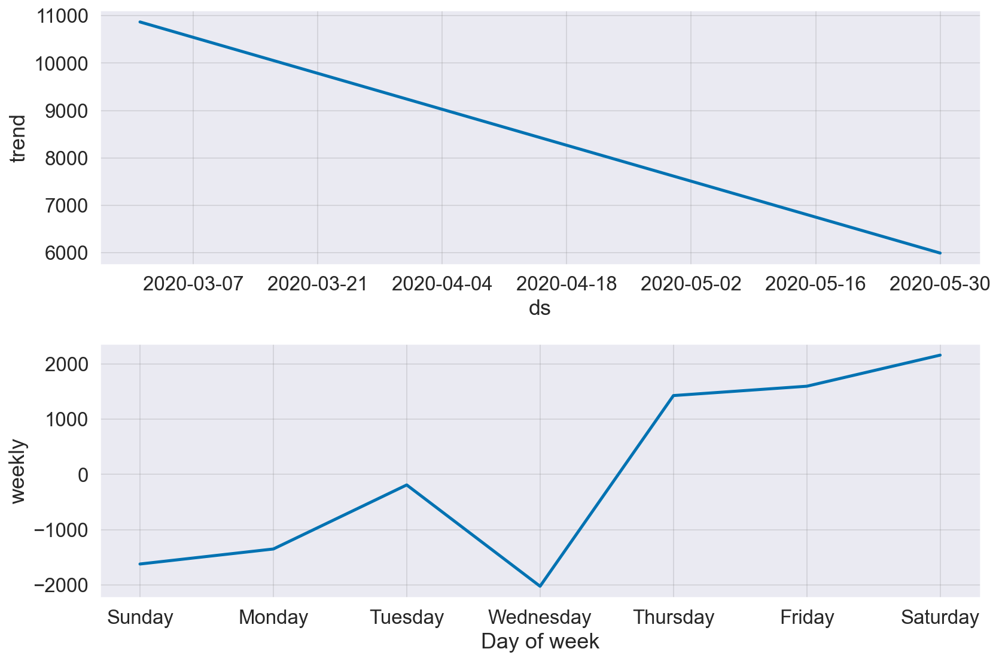

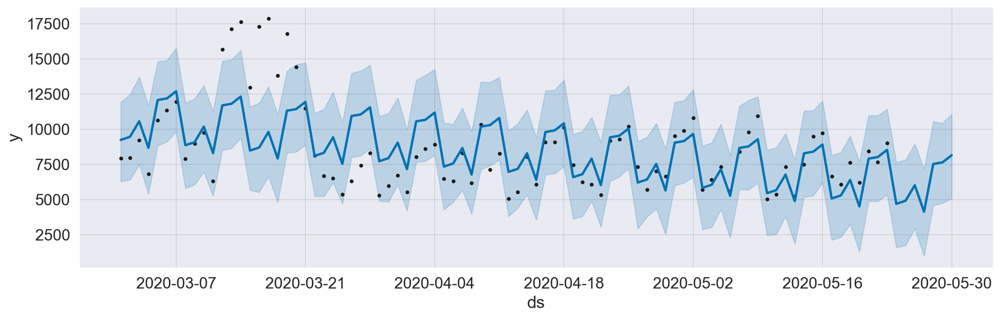

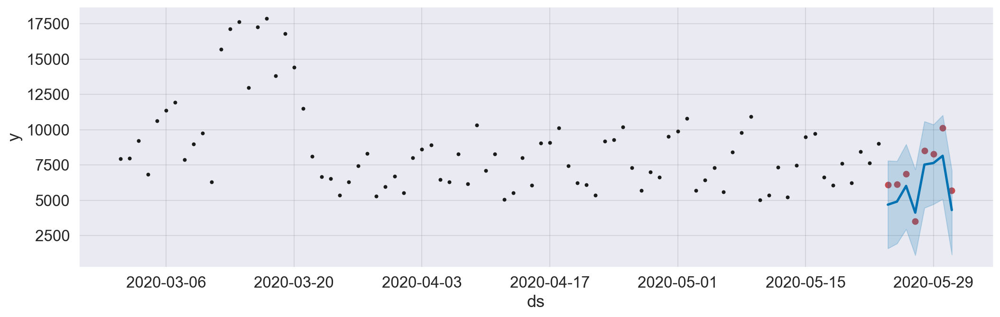

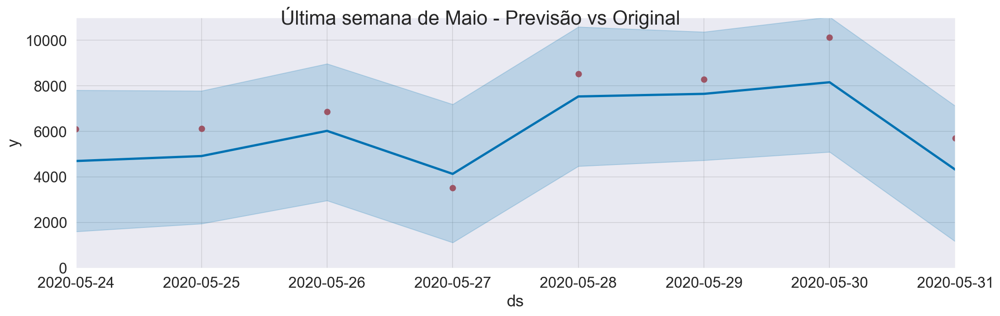

MAPE ------> 0.16899542665715367


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


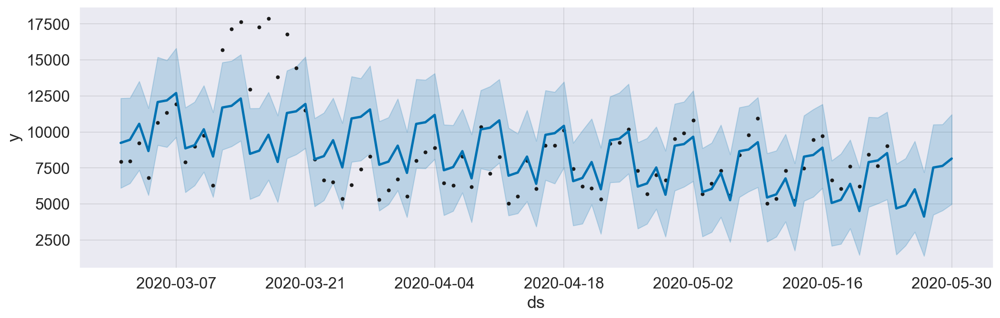

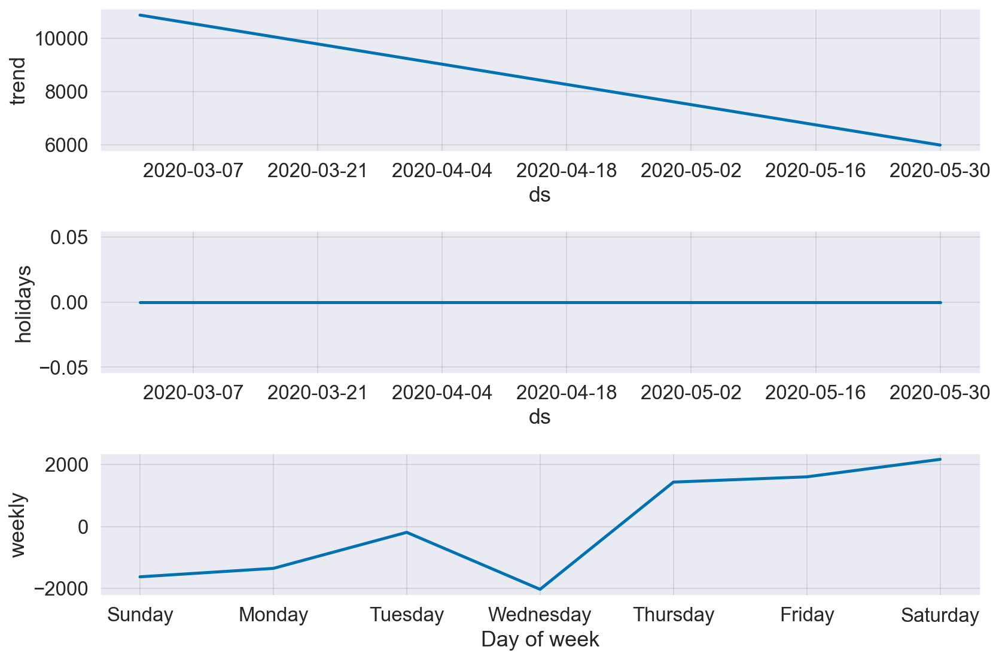

MAPE ------> 0.16899542665714887


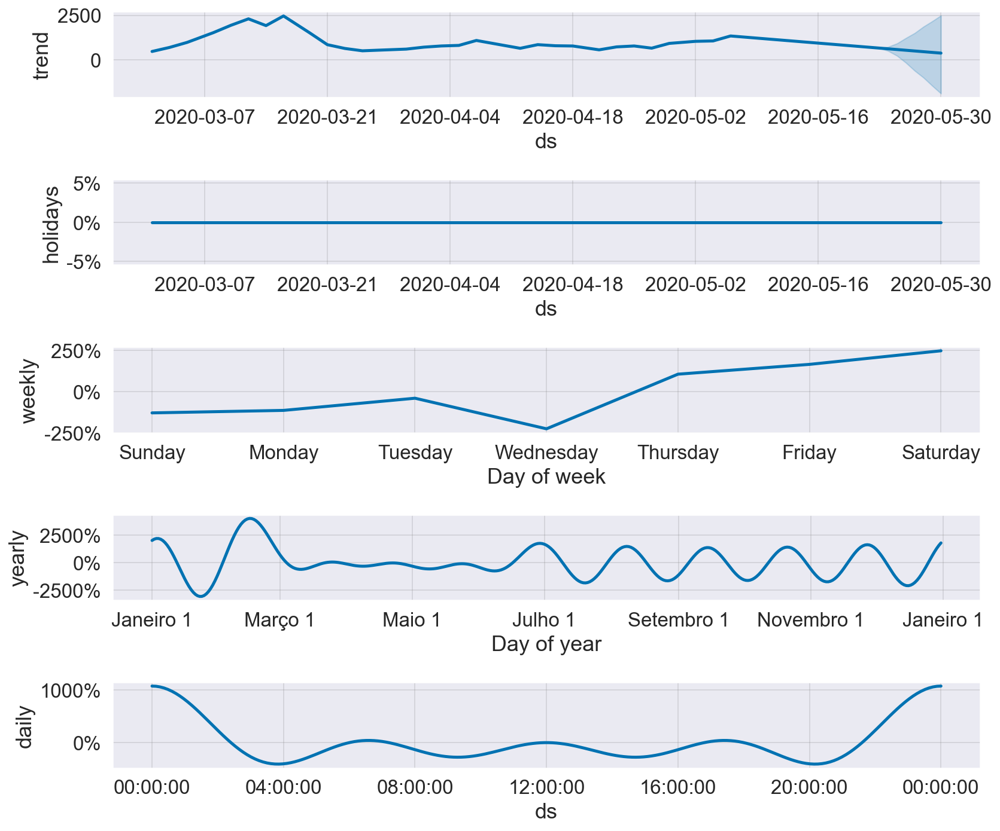

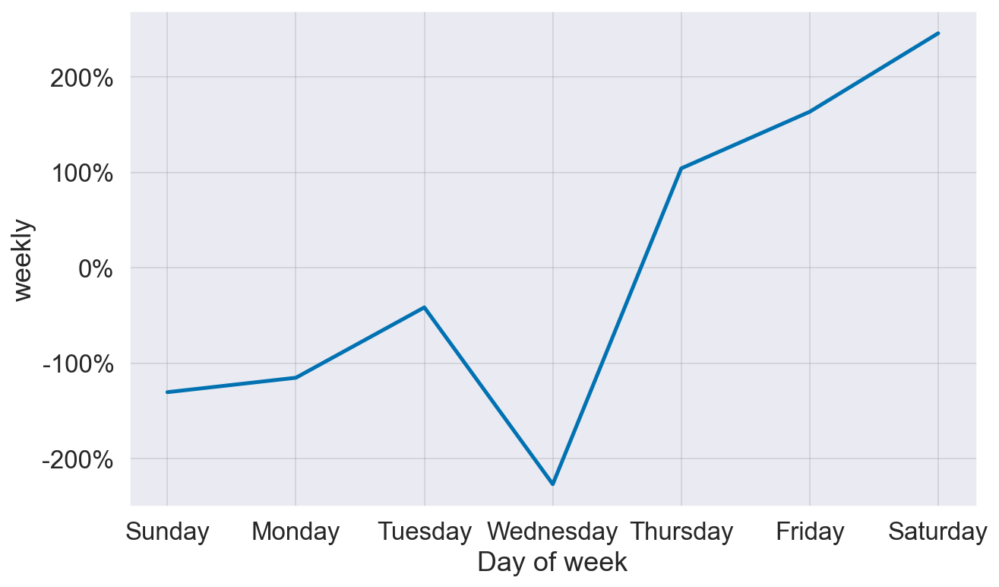

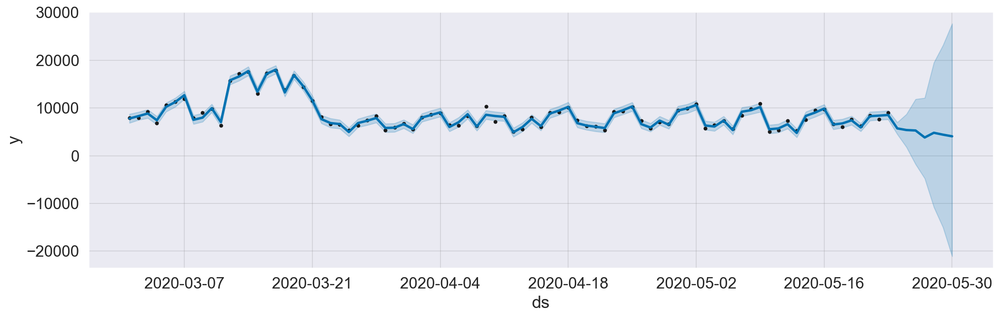

MAPE -----> 0.3272175767856876


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


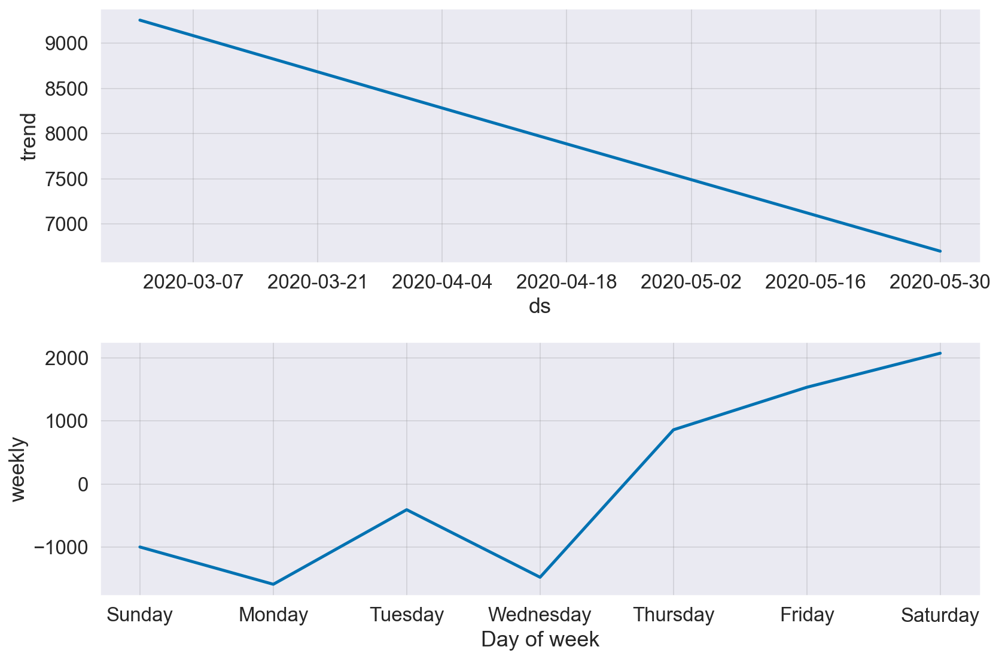

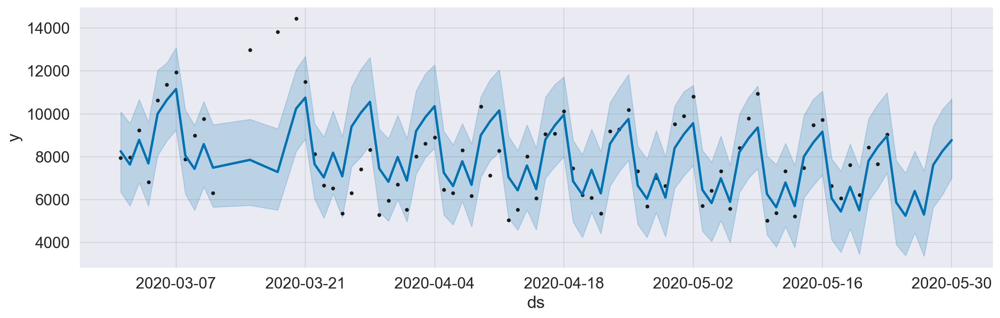

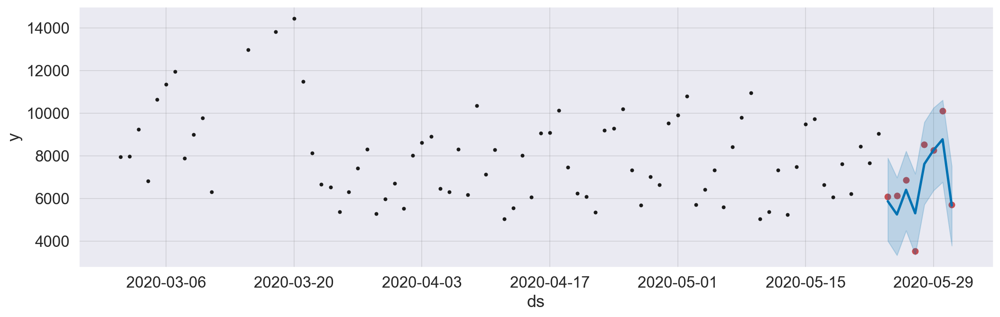

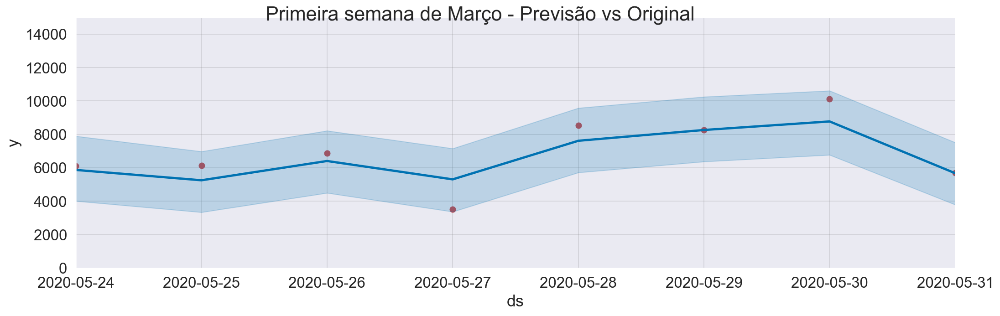

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


MAPE -----> 0.12482887010004967


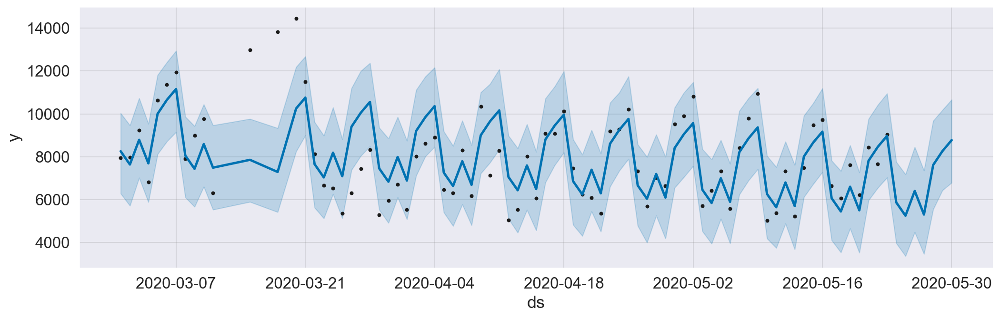

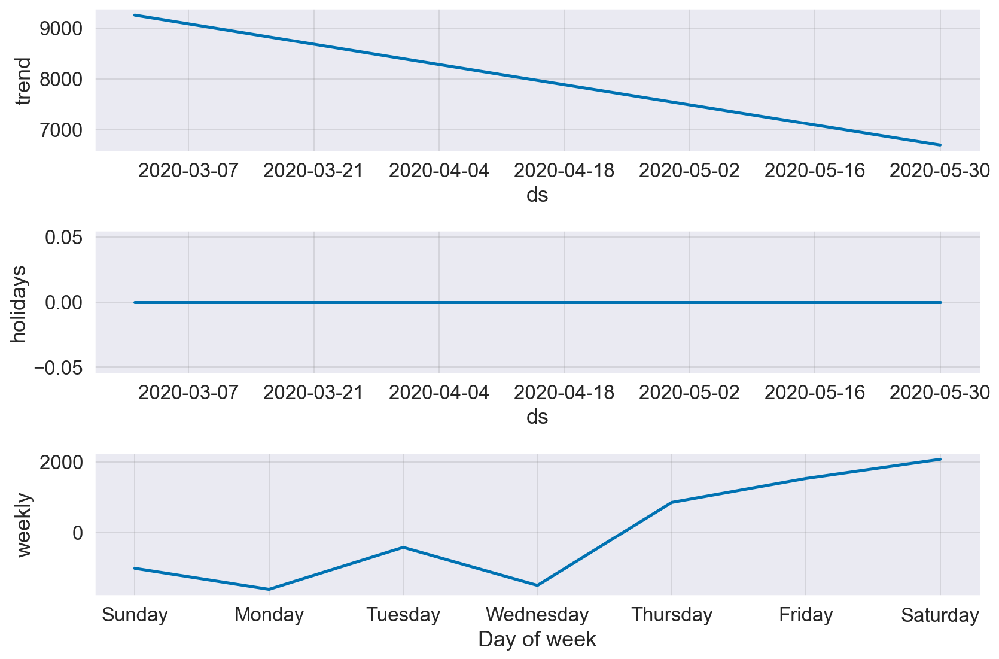

MAPE -----> 0.12482887010004917


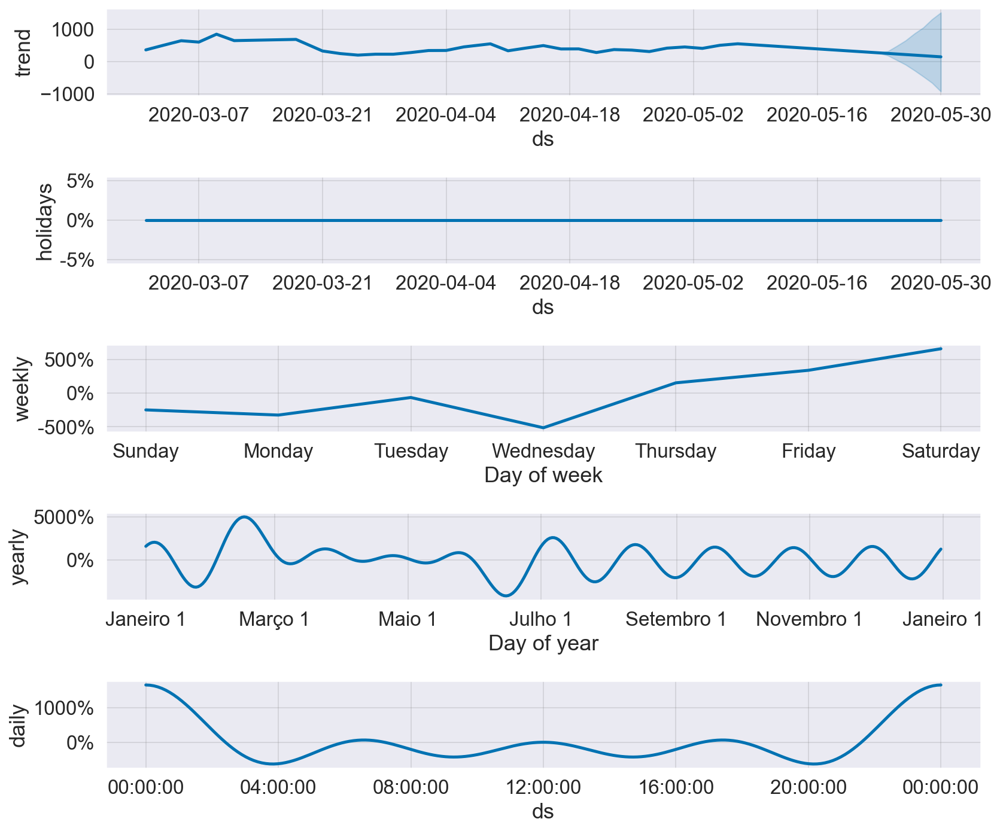

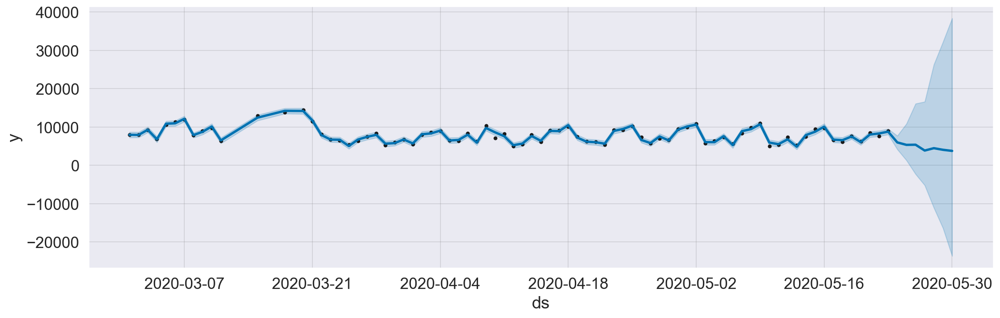

MAPE -----> 0.3451345117197922


In [7]:
%run "274_vendas_hora_dia.ipynb"

# Análise da previsão para quantidade de clientes

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


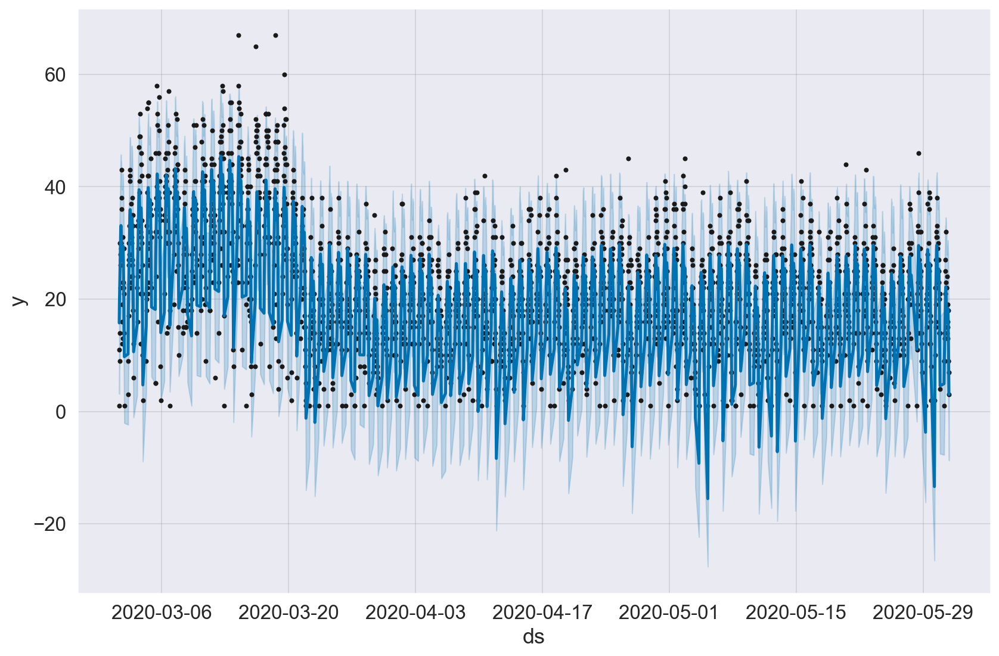

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


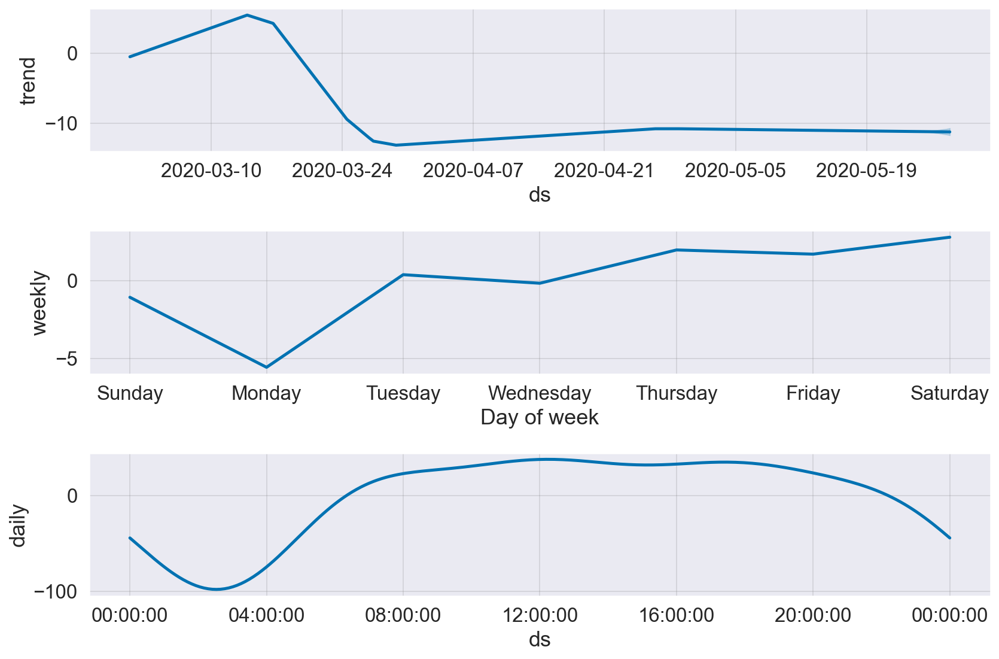

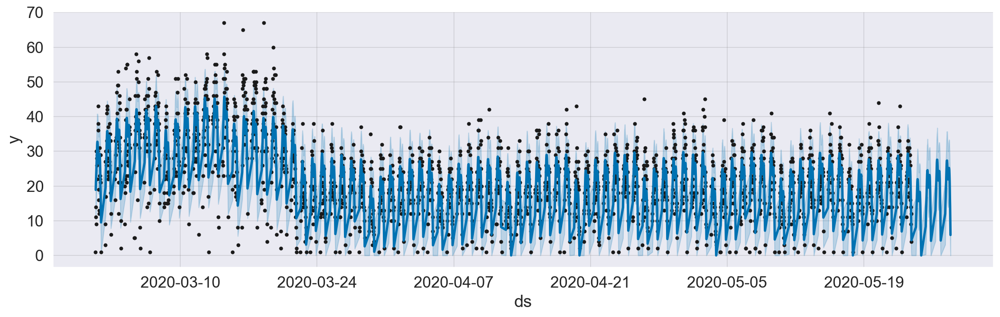

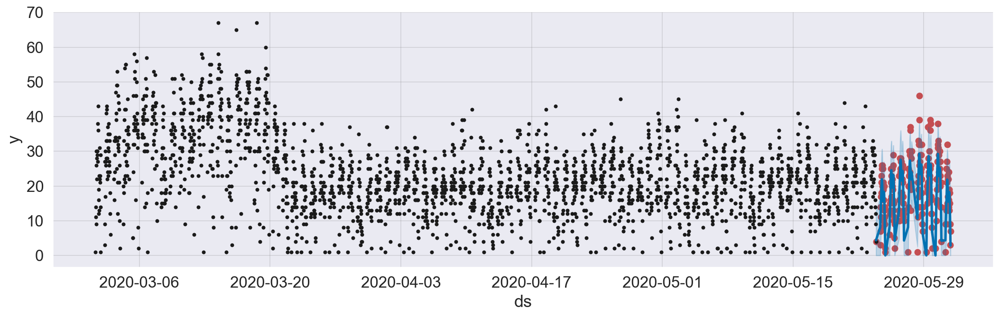

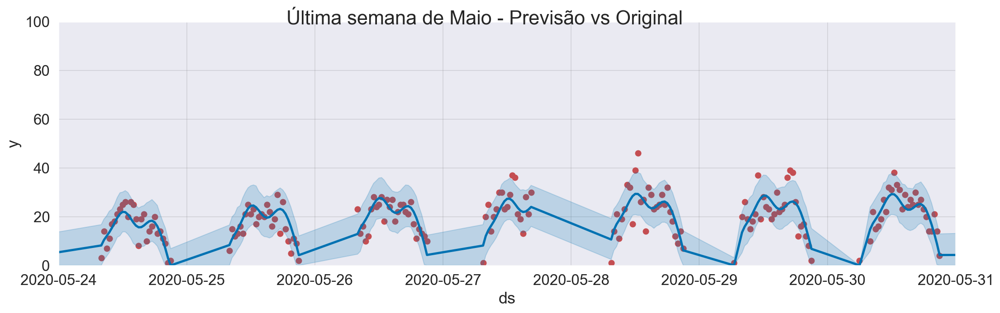

MAPE ------> 0.36810083250277376


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


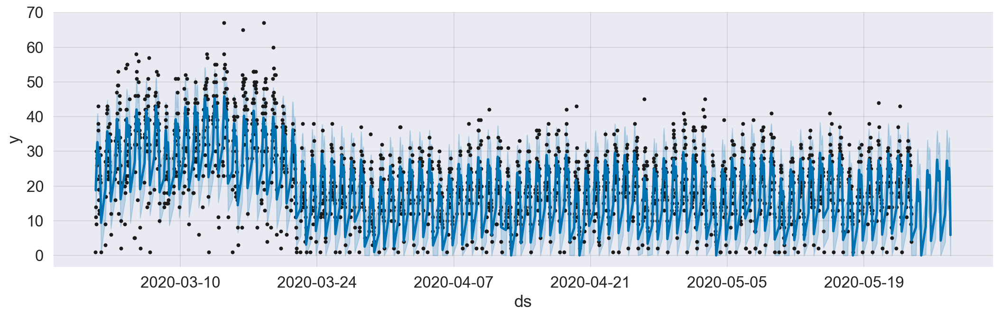

MAPE 0.36755197345935653


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


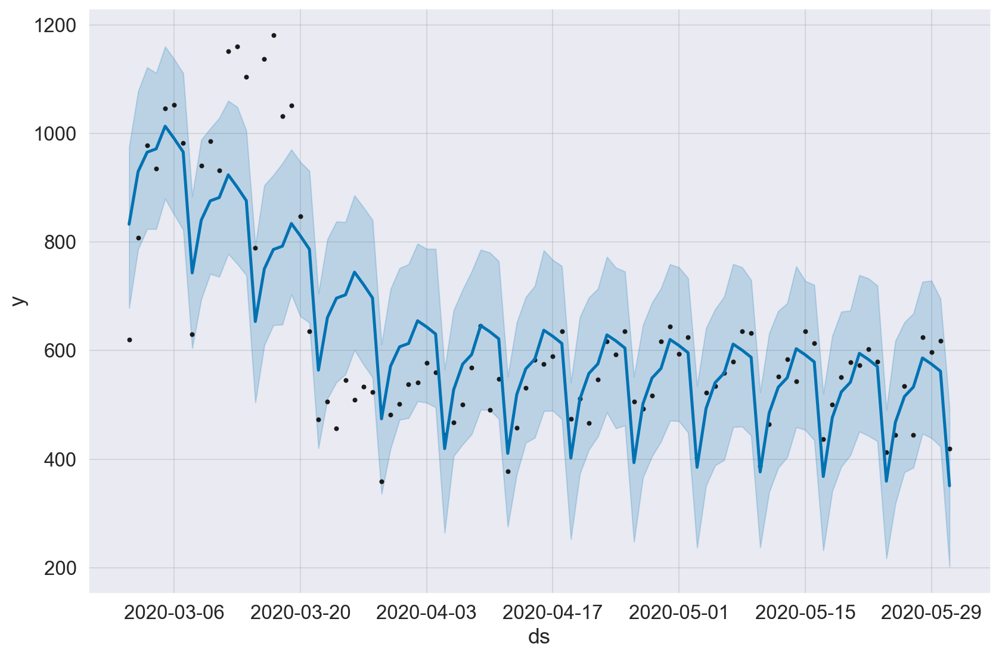

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


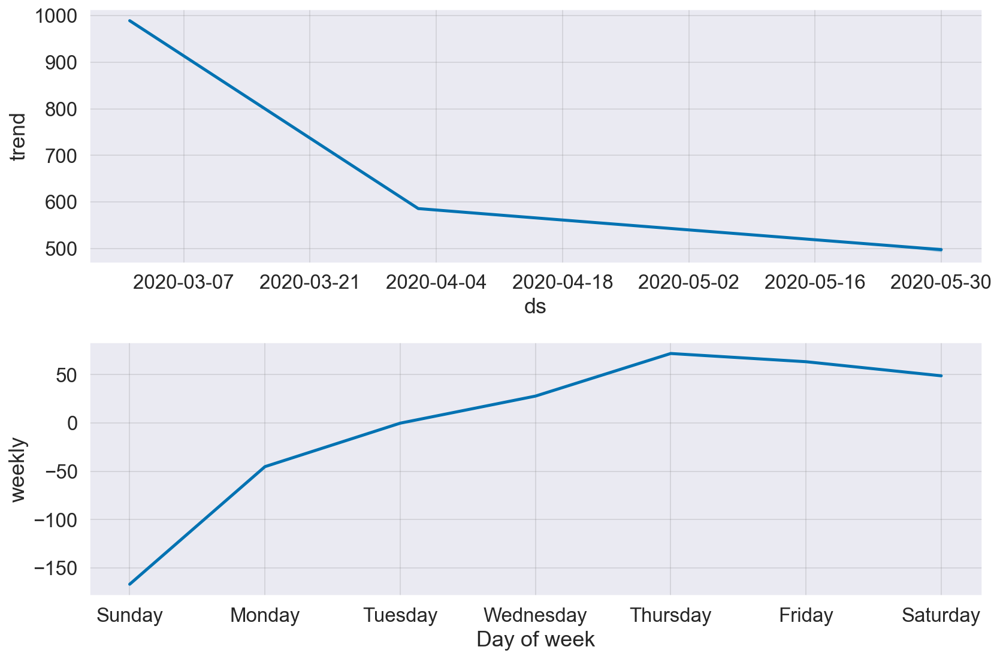

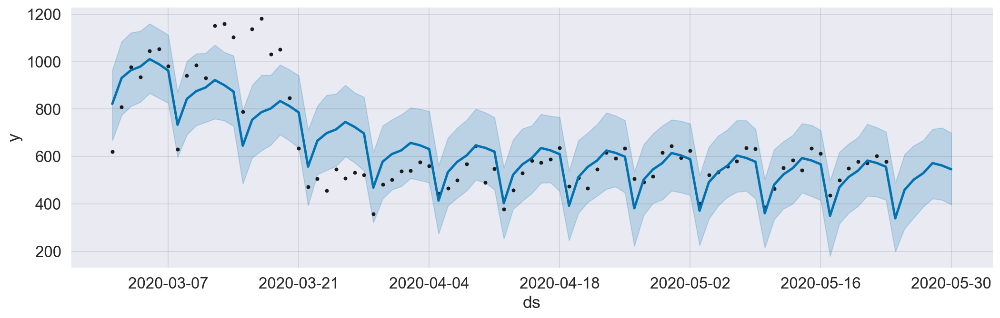

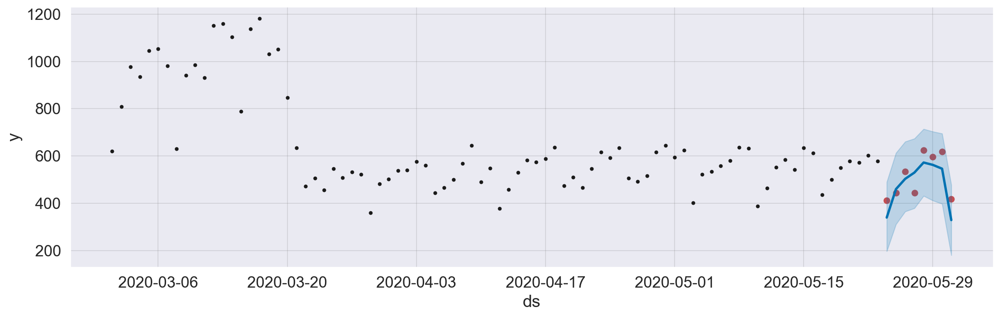

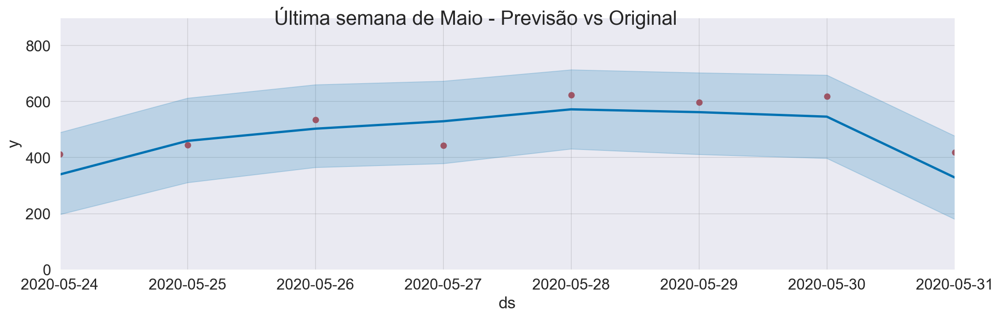

MAPE ------> 0.11685400904728263


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


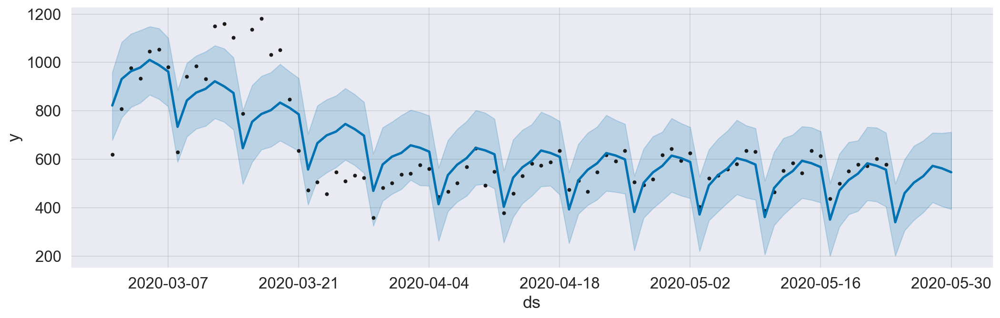

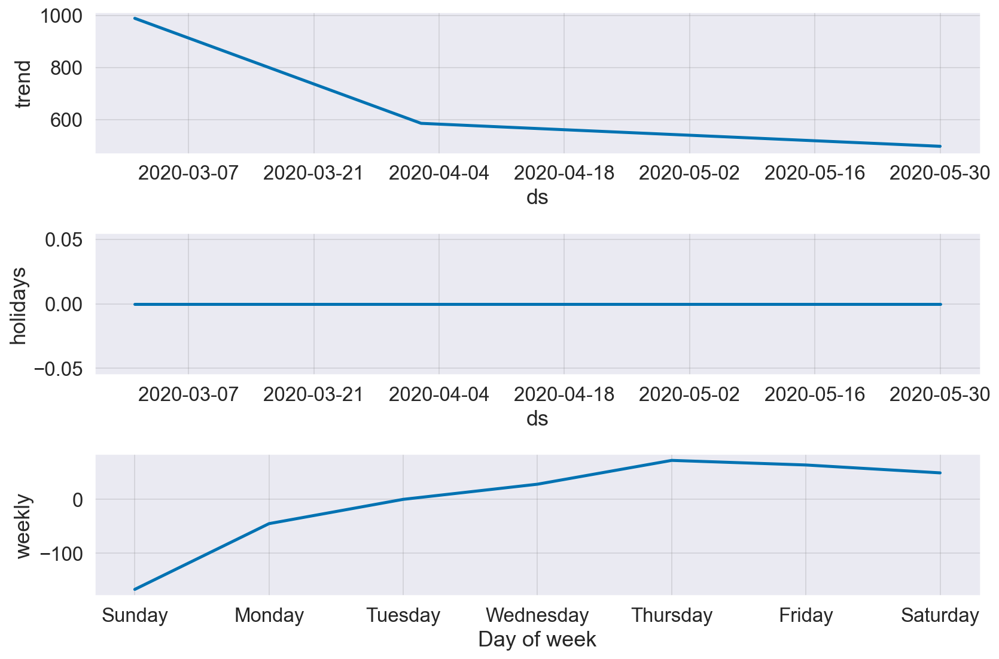

MAPE ------> 0.11685400903560592


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


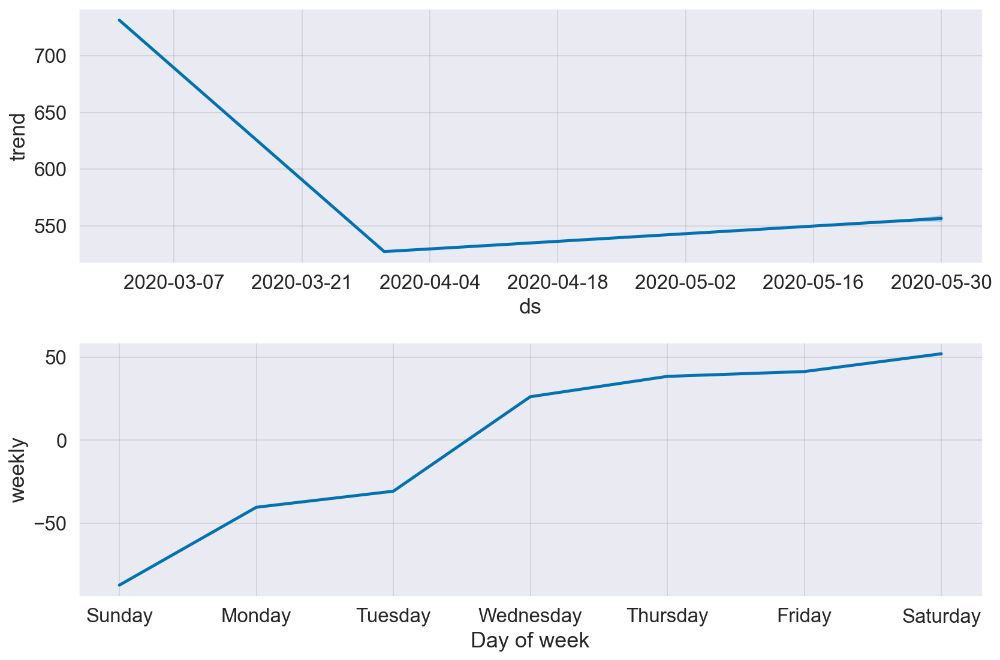

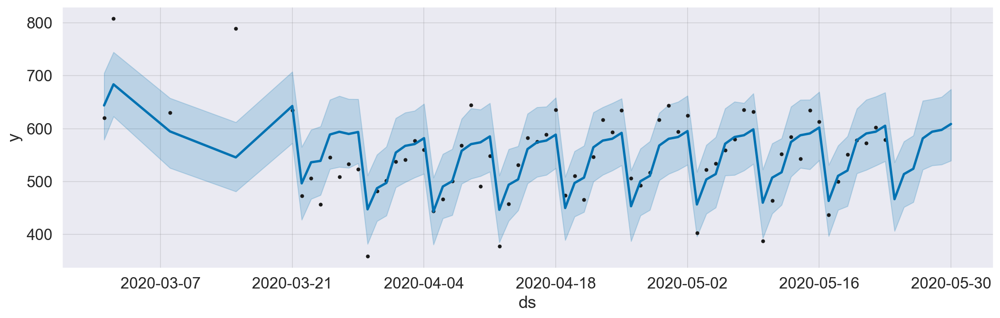

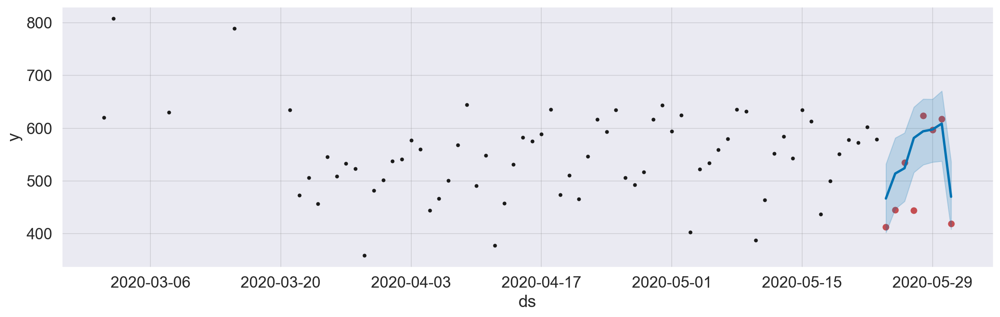

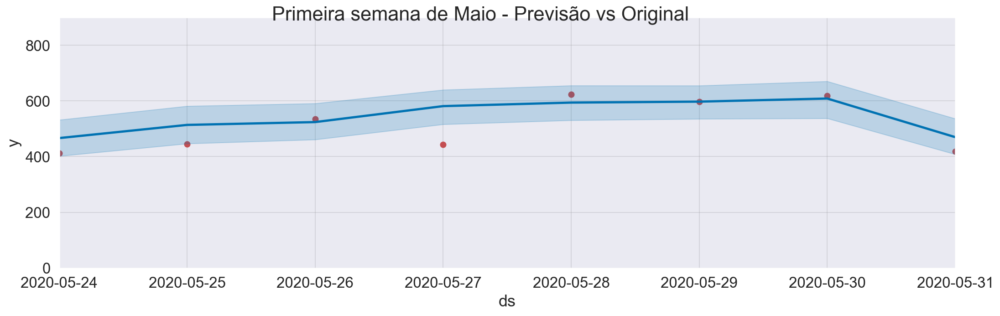

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


MAPE -----> 0.10003574900130739


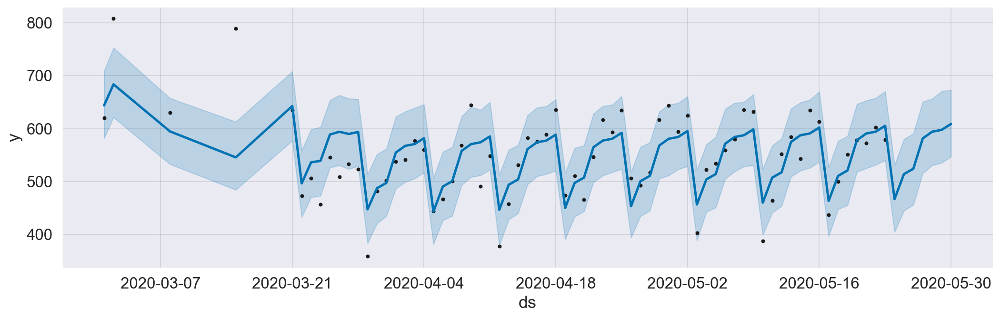

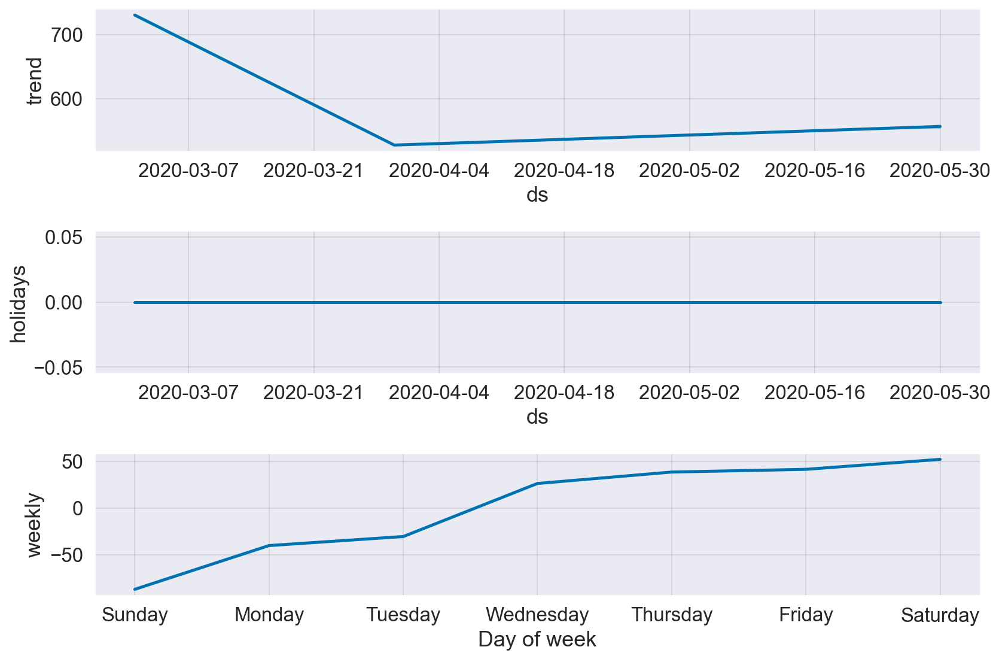

MAPE -----> 0.10003574900387568


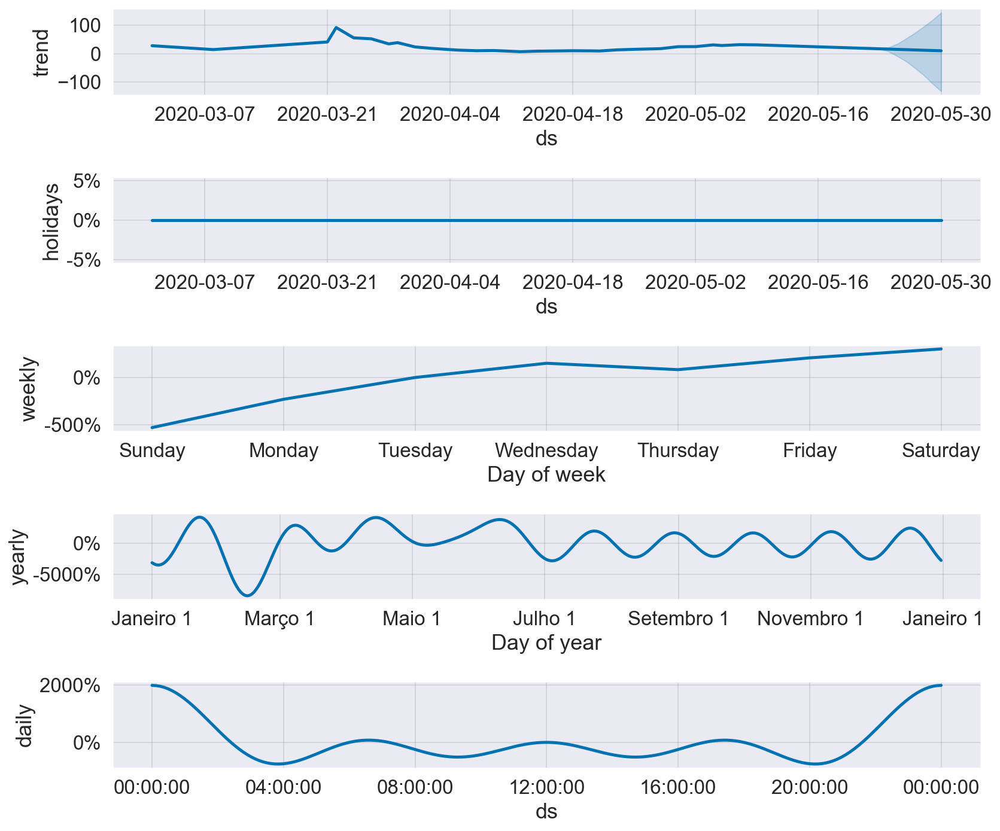

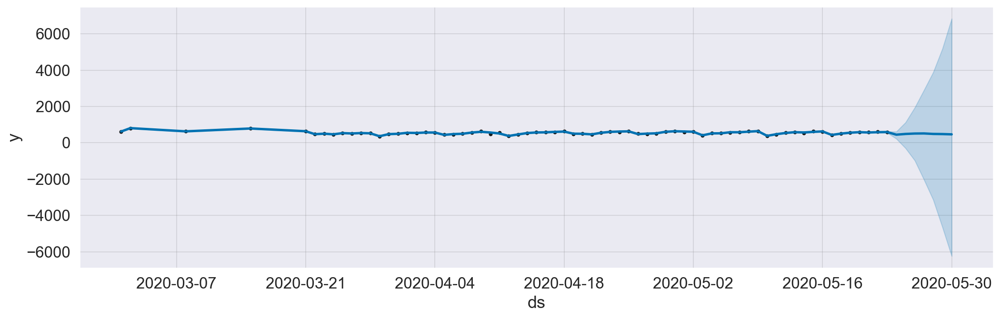

MAPE -----> 0.14809680821435012


In [9]:
%run "274_clientes_hora_dia.ipynb"